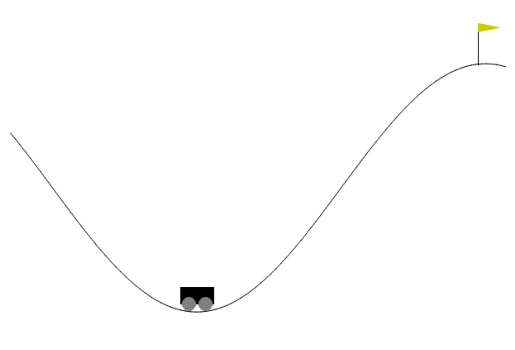

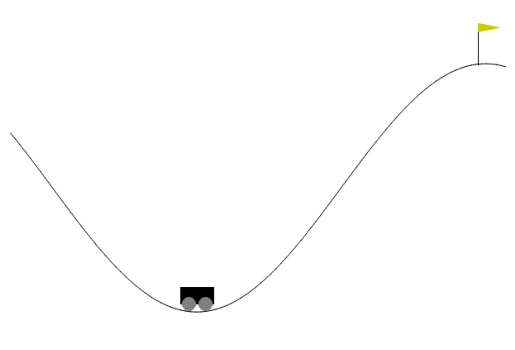

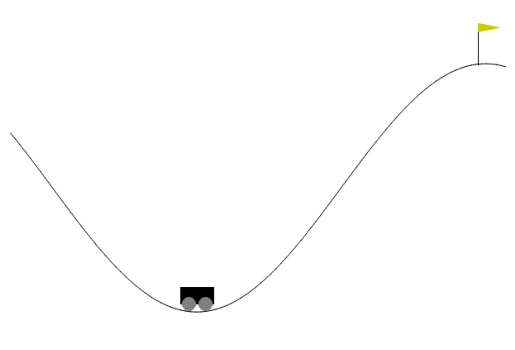

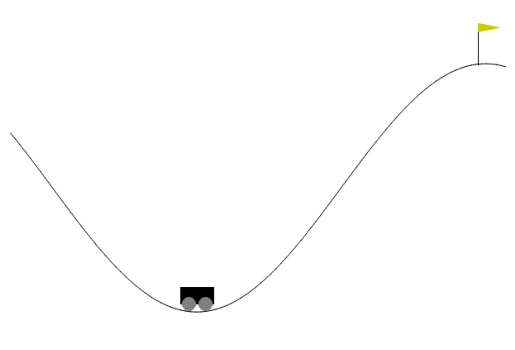

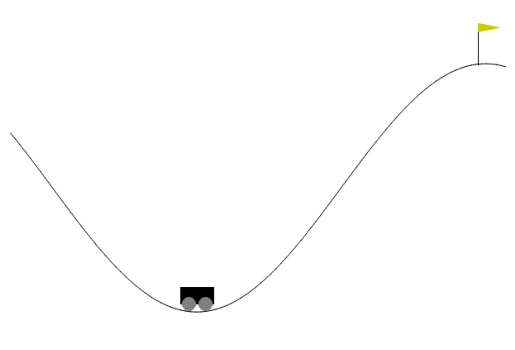

...

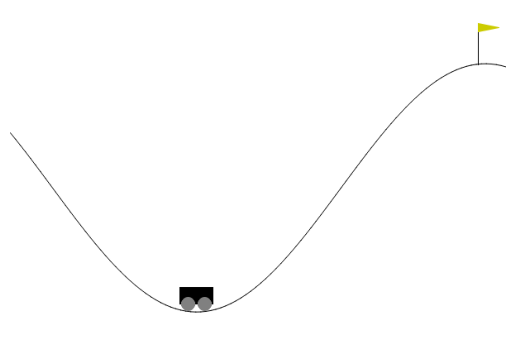

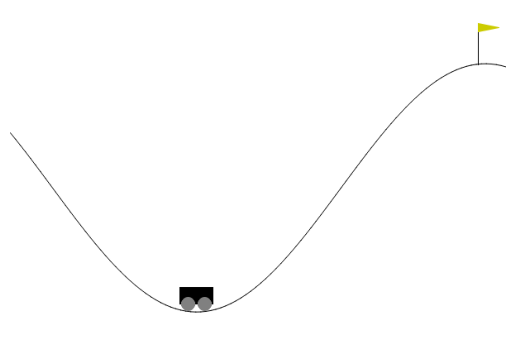

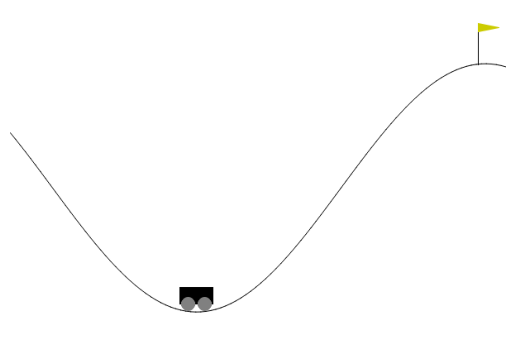

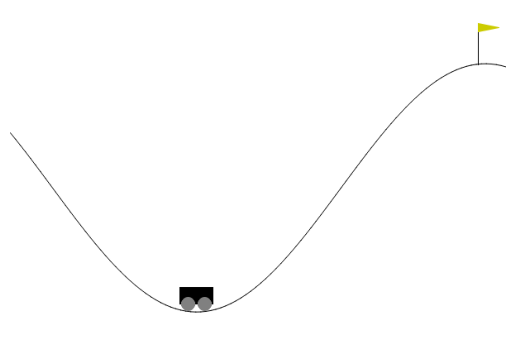

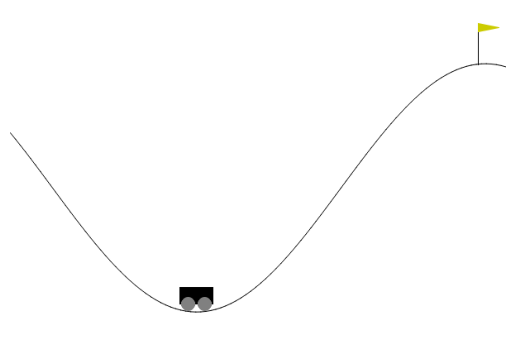

1 0.04156545549631119 0.7638229131698608
2 0.02706276625394821 0.3322194218635559
3 -0.04634007066488266 0.16331499814987183
4 -0.07603438943624496 2.9413559436798096
5 0.02800106257200241 0.025467978790402412
6 -0.06866569817066193 0.00858816783875227
7 -0.011974744498729706 0.003211512230336666
8 0.026427634060382843 0.001260149758309126
9 0.05850021168589592 0.0011000880040228367
10 -0.004043730907142162 0.0012419320410117507
11 0.030469205230474472 0.0012185957748442888
12 0.031211666762828827 0.0010081693762913346
13 -0.14110828936100006 0.0014616355765610933
14 0.01293705403804779 0.0011415585177019238
15 0.0328788198530674 0.0014511521439999342
16 0.06165357306599617 0.0010762762976810336
17 0.04698790982365608 5.173643589019775
18 -0.05356670916080475 0.001015741378068924
19 0.10355187207460403 0.0010717043187469244
20 -0.013991747051477432 0.0015878849662840366
21 0.03417225182056427 0.0018084448529407382
22 -0.07376096397638321 5.095706939697266
23 -0.0037799477577209473 0.00

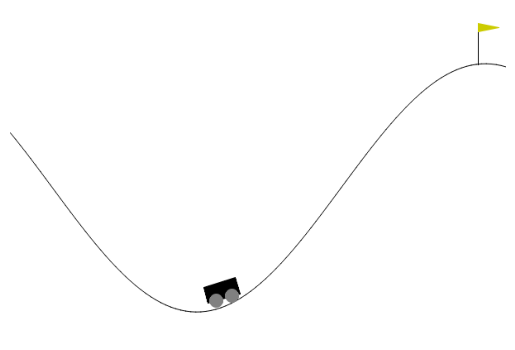

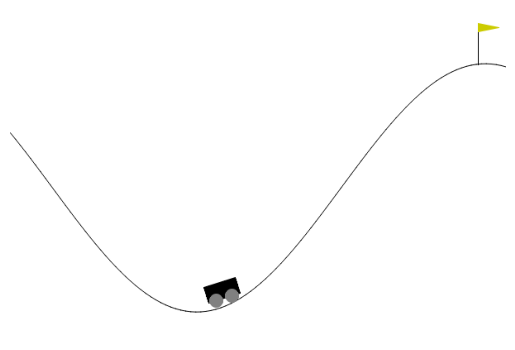

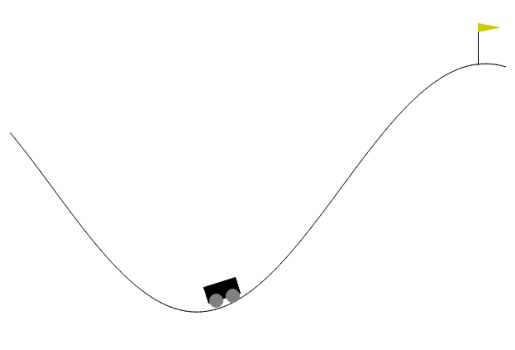

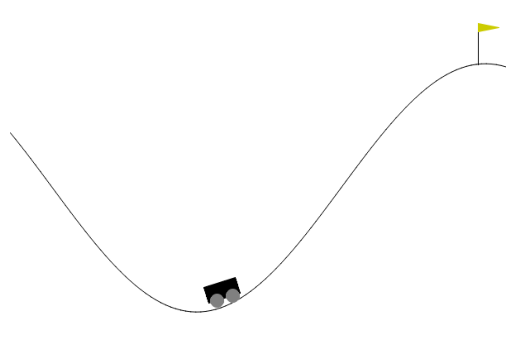

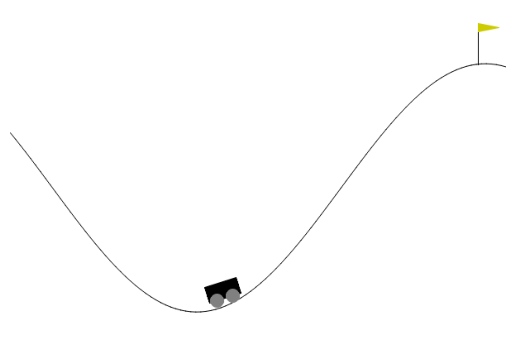

...

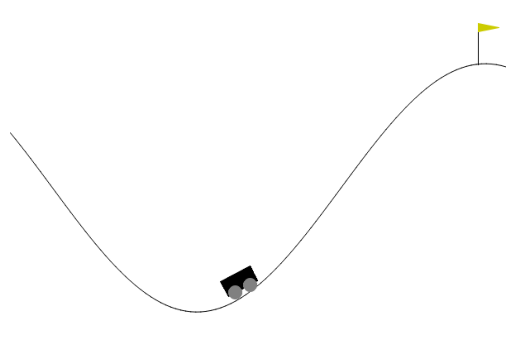

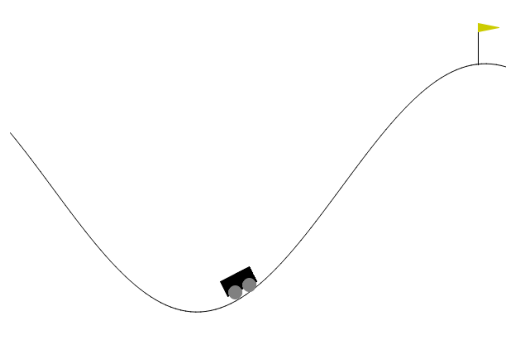

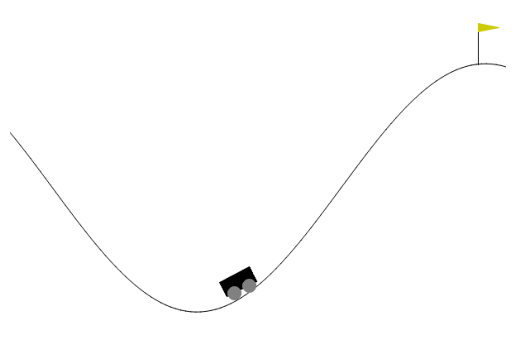

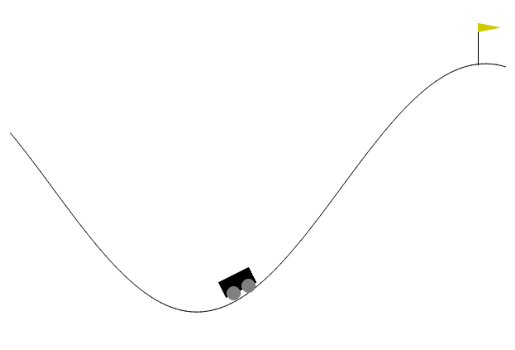

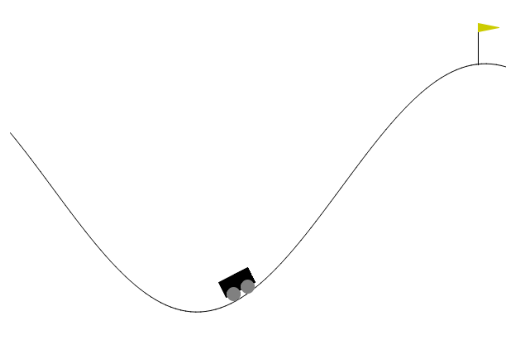

501 0.03701964020729065 0.0009478441206738353
502 0.0071853287518024445 0.0008241632604040205
503 -0.13059015572071075 0.0016228538006544113
504 -0.004819981753826141 0.0016037581954151392
505 0.017813391983509064 0.0008191736415028572
506 -0.05886641889810562 0.0009869951754808426
507 0.020507723093032837 0.0011788023402914405
508 -0.1112089678645134 0.0010872186394408345
509 -0.12645725905895233 0.0015455230604857206
510 0.04439561069011688 0.0012682119850069284
511 0.03488500788807869 0.001511413254775107
512 -0.031281016767024994 0.0013253269717097282
513 -0.0380602590739727 0.0009488996583968401
514 0.0015191920101642609 0.0016545300604775548
515 -0.008220471441745758 0.0015377734089270234
516 0.07114867866039276 0.0009597265161573887
517 0.13359777629375458 0.0010852229315787554
518 0.016720235347747803 0.0015298437792807817
519 -0.054290421307086945 5.121861457824707
520 0.05923301354050636 5.176568984985352
521 -0.006812684237957001 0.0014390693977475166
522 0.00264005362987518

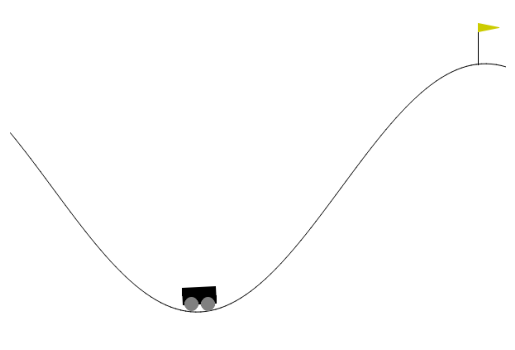

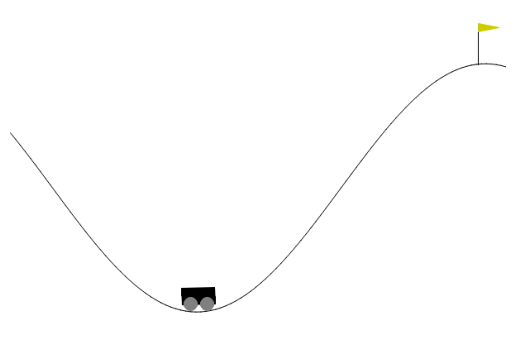

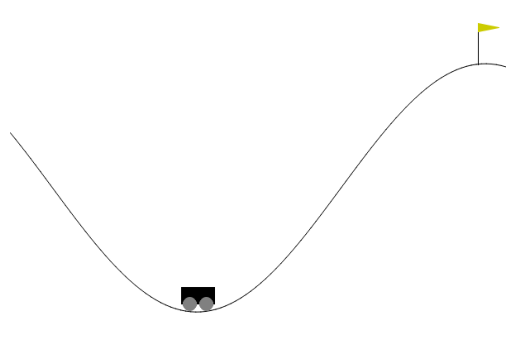

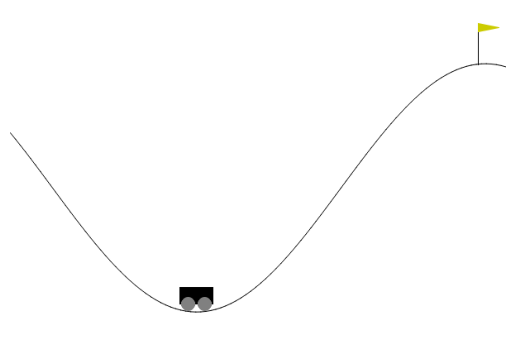

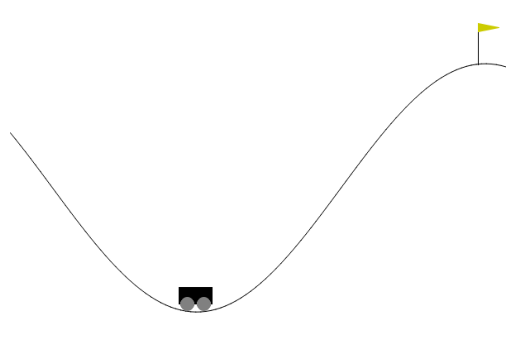

...

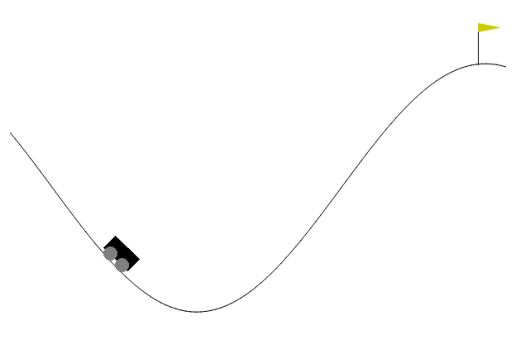

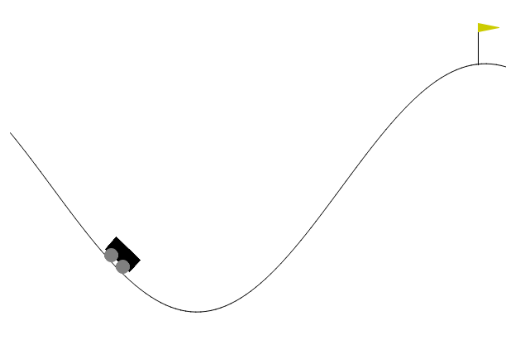

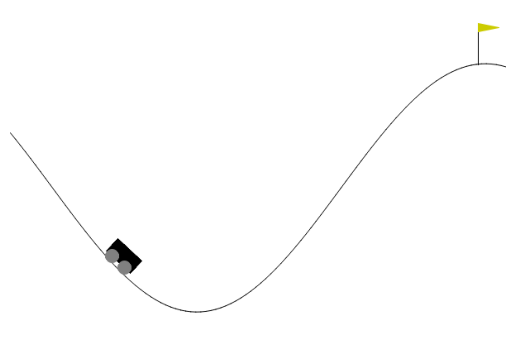

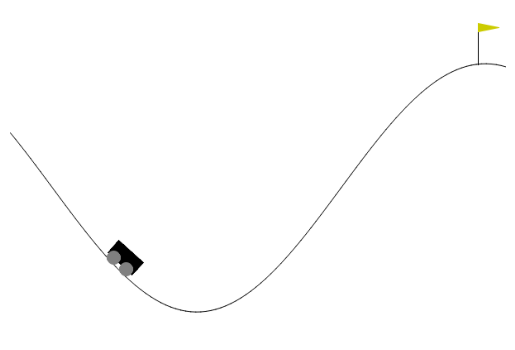

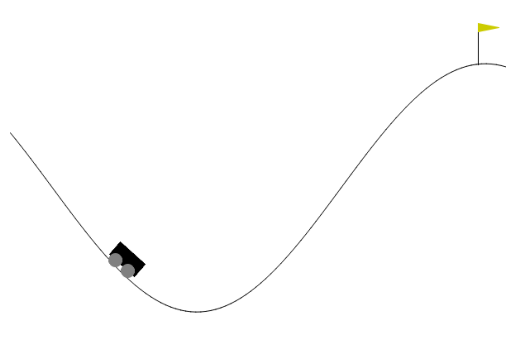

1001 -0.04653090238571167 0.0008884396520443261
1002 -0.028254225850105286 0.0014294151915237308
1003 -0.028598183766007423 0.001248965272679925
1004 -0.10839959979057312 0.0012841434217989445
1005 -0.09380387514829636 0.0016521511133760214
1006 -0.04502549022436142 5.09063720703125
1007 -0.016934728249907494 0.0012297173961997032
1008 -0.031131522729992867 5.038541316986084
1009 0.006732732057571411 0.0017525993753224611
1010 -0.028030093759298325 0.0011186887277290225
1011 0.0358462892472744 0.001267103012651205
1012 -0.011515691876411438 0.0014560626586899161
1013 -0.058100342750549316 0.0013574246549978852
1014 -0.027167532593011856 5.183108329772949
1015 -0.007846551015973091 0.0011450857855379581
1016 0.041773416101932526 0.0012783202109858394
1017 -0.015150878578424454 0.0009239420178346336
1018 0.03608953580260277 0.0008922031847760081
1019 0.07816162705421448 0.001562307239510119
1020 0.017993010580539703 0.0006743356352671981
1021 -0.0158335343003273 0.001216465258039534
1022

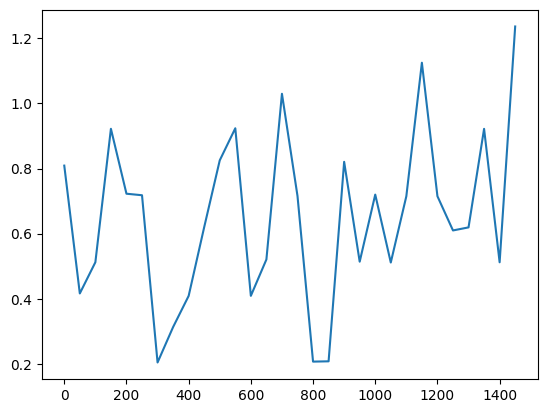

Policy Network Loss


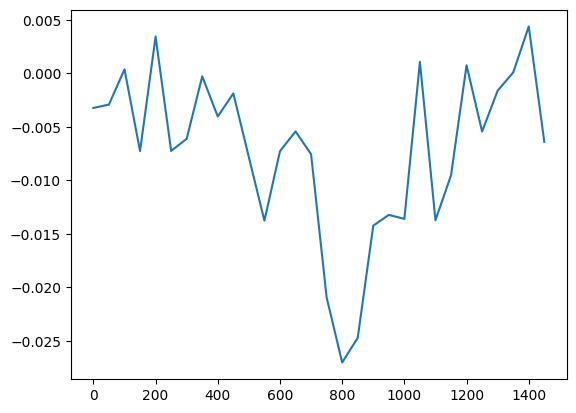

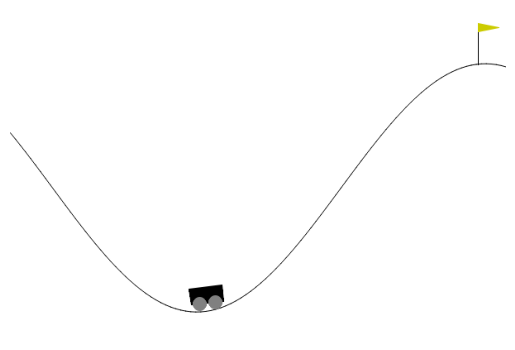

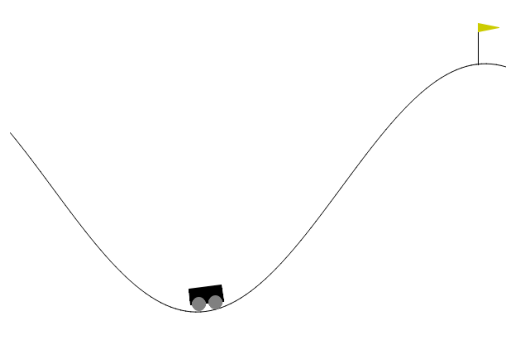

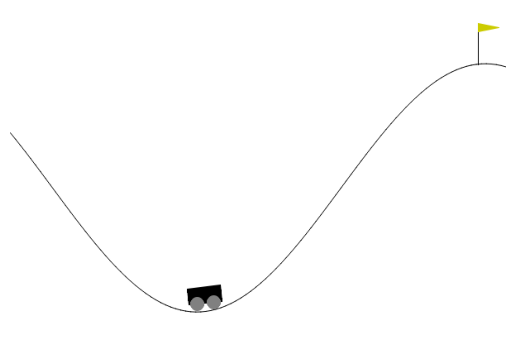

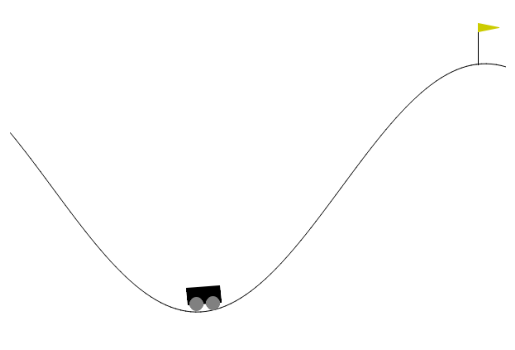

...

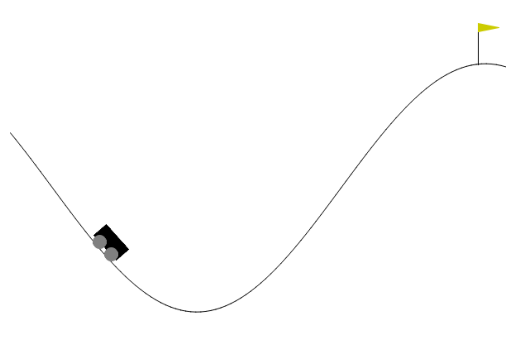

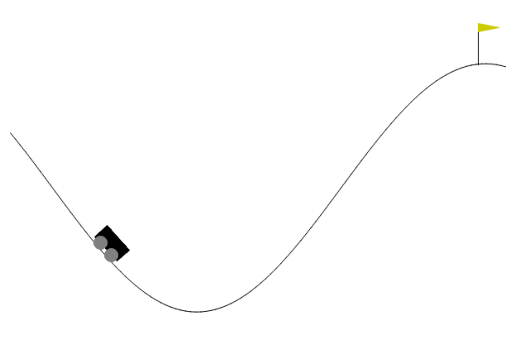

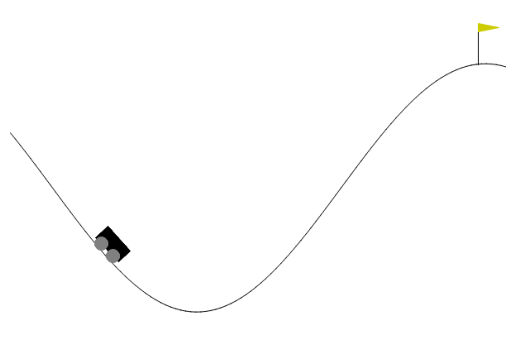

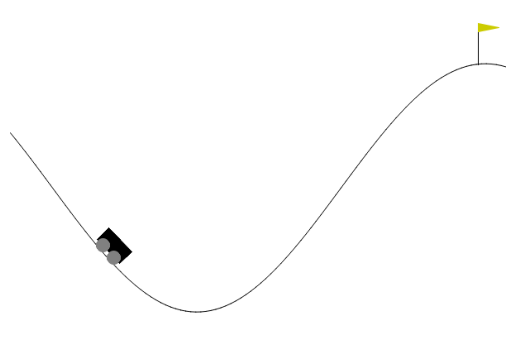

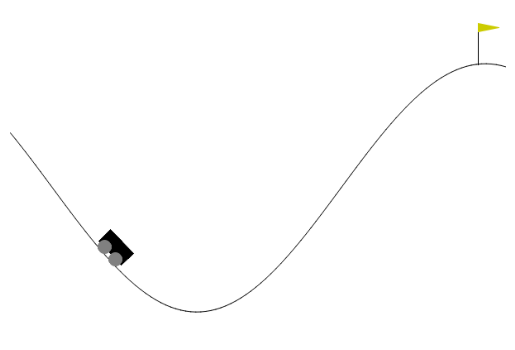

In [ ]:
import gymnasium as gym
import torch
import torch.nn as nn
import numpy as np
import random
import matplotlib.pyplot as plt
train_env = gym.make('MountainCar-v0', render_mode=None)
test_env = gym.make('MountainCar-v0', render_mode="rgb_array")

episodes = 1500
discount = 0.95
step_size = 0.01
batch_size = 64
epsilon = 1
value_losses = []
policy_losses = []

class Actor(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(train_env.observation_space.shape[0], 16)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(16, 16)
        self.relu = nn.ReLU()
        self.fc3 = nn.Linear(16, train_env.action_space.n)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        x = self.softmax(x)
        return x

class Critic(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(train_env.observation_space.shape[0], 8)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(8, 8)
        self.relu = nn.ReLU()
        self.fc3 = nn.Linear(8, 1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        return x

policy_net = Actor()
value_net = Critic()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
policy_net.to(device)
value_net.to(device)
criterion = nn.MSELoss()
policy_optimizer = torch.optim.Adam(policy_net.parameters(), lr=step_size)
value_optimizer = torch.optim.Adam(value_net.parameters(), lr=step_size)
buffer = []

def show_ep():
    frame = test_env.render()
    plt.imshow(frame)
    plt.axis("off")
    plt.show()

for ep in range(episodes):
    done = False
    obs, info = train_env.reset()
    t = 0
    avg_policy_loss = 0
    avg_value_loss = 0
    epsilon = max(0.05, 1-ep/episodes)
    if ep>0:
        print(ep, policy_losses[-1], value_losses[-1])

    while not done:
        #show_ep()
        t += 1
        pred = policy_net(torch.tensor(obs, dtype=torch.float32, device=device).unsqueeze(0))
        if np.random.rand() < epsilon:
            action = train_env.action_space.sample()
        else:
            action = torch.distributions.Categorical(pred).sample().item()

        save_obs = obs
        obs, reward, terminated, truncated, info = train_env.step(action)
        reward += abs(obs[1])
        done = t>500 or terminated

        buffer.append((save_obs, reward, action, obs, done))
        buffer = buffer[-int(1e4):]

        if len(buffer)>=batch_size:
            batch = random.sample(buffer, batch_size)

            states, rewards, actions, next_states, dones = zip(*batch)
            states = torch.tensor(np.array(states), dtype=torch.float32, device=device)
            rewards = torch.tensor(rewards, dtype=torch.float32, device=device)
            actions = torch.tensor(actions, dtype=torch.int64, device=device)
            next_states = torch.tensor(np.array(next_states), dtype=torch.float32, device=device)
            dones = torch.tensor(dones, dtype=torch.float32, device=device)

            with torch.no_grad():
                td_target = rewards + discount * value_net(next_states).squeeze(1) * (1 - dones)
            V_s = value_net(states).squeeze(1)
            td_error = td_target - V_s
            advantages = (td_error - td_error.mean()) / (td_error.std() + 1e-8)

            critic_loss = criterion(V_s, td_target)
            value_optimizer.zero_grad()
            critic_loss.backward()
            value_optimizer.step()
            avg_value_loss = (avg_value_loss*(t-1)+np.mean(critic_loss.item()))/t

            action_probs = torch.log_softmax(policy_net(states), dim=1).gather(1, actions.unsqueeze(1)).squeeze(1)
            actor_loss = -(action_probs * advantages.detach()).mean()
            policy_optimizer.zero_grad()
            actor_loss.backward()
            policy_optimizer.step()
            avg_policy_loss = (avg_policy_loss*(t-1)+np.mean(actor_loss.item()))/t

    value_losses.append(critic_loss.item())
    policy_losses.append(actor_loss.item())

    if ep%500==0:
        done = False
        obs, info = test_env.reset()
        while not done:
            pred = policy_net(torch.tensor(obs).unsqueeze(0))
            obs, reward, terminated, truncated, info = test_env.step(torch.argmax(pred).item())
            done = truncated or terminated
            show_ep()

window = 50
x = range(0,episodes,window)
print('Value Network Loss')
avg_value = [float(np.mean(value_losses[i:i+window])) for i in x]
plt.plot(x,avg_value)
plt.show()
print('Policy Network Loss')
avg_policy = [float(np.mean(policy_losses[i:i+window])) for i in x]
plt.plot(x,avg_policy)
plt.show()

done = False
obs, info = test_env.reset()
while not done:
    pred = policy_net(torch.tensor(obs).unsqueeze(0))
    obs, reward, terminated, truncated, info = test_env.step(torch.argmax(pred).item())
    done = truncated or terminated
    show_ep()